In [20]:
import os
import matplotlib.pyplot as plt
import cv2
import numpy as np
import scipy
from tqdm import tqdm
import time as t
import sys
from PIL import Image
from IPython.display import display

IMG_DIR = 'data/chess1/ambient/F0/'
left_imgfile = os.path.join(IMG_DIR, 'im0e0.png')
right_imgfile = os.path.join(IMG_DIR, 'im1e0.png')

In [12]:
# gray scale
# IMG_SIZE = (int(1920 / 120 * 60), int(1080 /120 * 60))
left_img = cv2.imread(left_imgfile, cv2.IMREAD_GRAYSCALE)
right_img = cv2.imread(right_imgfile, cv2.IMREAD_GRAYSCALE)

# left_img = cv2.resize(left_img, IMG_SIZE)
# right_img = cv2.resize(right_img, IMG_SIZE)

In [24]:
height, width = left_img.shape

In [18]:
max_disparity = 64
P1 = 10
P2 = 120
csize = (5,5)
bsize = (3,3)

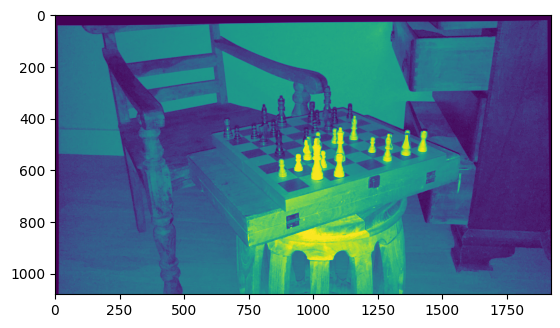

In [13]:
plt.imshow(left_img)

In [14]:
def compute_census(left, right, csize, height, width):
    """
    Calculate census bit strings for each pixel in the left and right images.
    Arguments:
        - left: left grayscale image.
        - right: right grayscale image.
        - csize: kernel size for the census transform.
        - height: number of rows of the image.
        - width: number of columns of the image.

    Return: Left and right images with pixel intensities replaced with census bit strings.
    """
    cheight = csize[0]
    cwidth = csize[1]
    y_offset = int(cheight / 2)
    x_offset = int(cwidth / 2)

    left_census_values = np.zeros(shape=(height, width), dtype=np.uint64)
    right_census_values = np.zeros(shape=(height, width), dtype=np.uint64)

    print('\tComputing left and right census...', end='')
    sys.stdout.flush()
    dawn = t.time()
    # offset is used since pixels on the border will have no census values
    for y in range(y_offset, height - y_offset):
        for x in range(x_offset, width - x_offset):
            # left
            center_pixel = left[y, x]
            reference = np.full(shape=(cheight, cwidth), fill_value=center_pixel, dtype=np.int32)
            image = left[(y - y_offset):(y + y_offset + 1), (x - x_offset):(x + x_offset + 1)]
            comparison = image - reference
            # If value is less than center value assign 1 otherwise assign 0 
            left_census_pixel_array = np.where(comparison < 0, 1, 0).flatten()
            # Convert census array to an integer by using bit shift operator
            left_census_pixel = np.int32(left_census_pixel_array.dot(1 << np.arange(cheight * cwidth)[::-1])) 
            left_census_values[y, x] = left_census_pixel

            # right
            center_pixel = right[y, x]
            reference = np.full(shape=(cheight, cwidth), fill_value=center_pixel, dtype=np.int32)
            image = right[(y - y_offset):(y + y_offset + 1), (x - x_offset):(x + x_offset + 1)]
            comparison = image - reference
            # If value is less than center value assign 1 otherwise assign 0 
            right_census_pixel_array = np.where(comparison < 0, 1, 0).flatten()
            # Convert census array to an integer by using bit shift operator
            right_census_pixel = np.int32(right_census_pixel_array.dot(1 << np.arange(cheight * cwidth)[::-1])) 
            right_census_values[y, x] = right_census_pixel

    dusk = t.time()
    print('\t(done in {:.2f}s)'.format(dusk - dawn))

    return left_census_values, right_census_values

In [19]:
H, W = left_img.shape
left_census, right_census = compute_census(left_img, right_img, csize = (7, 7), height = H, width = W)


	Computing left and right census...	(done in 26.51s)


In [38]:
center_pixel = 128

image = np.array([[123, 123, 255],
                  [127, 128, 142],
                  [53,   24,  39]])

reference = np.full((3,3), fill_value = center_pixel, dtype = np.int32)

comparison = image - reference

left_census_pixel_array = np.where(comparison < 0, 1 , 0).flatten()

left_census_pixel_array
left_census_pixel = np.int32(left_census_pixel_array.dot(1 << np.arange(3*3)[::-1]))



[1 1 0 1 0 0 1 1 1]
423


423

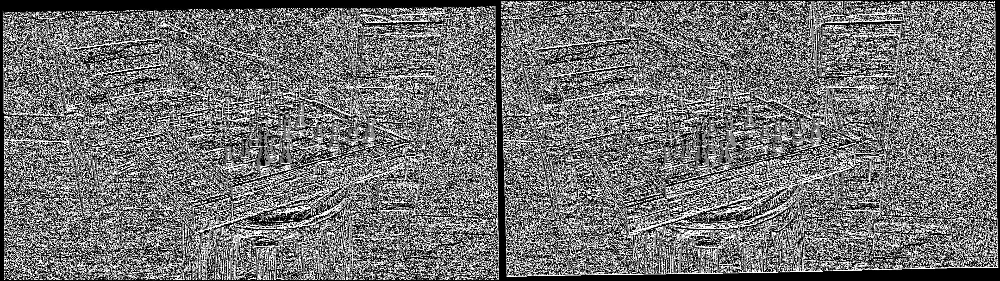

In [21]:
joined_census = np.concatenate([np.uint8(left_census), np.uint8(right_census)], axis=1)
display(Image.fromarray(joined_census))

In [22]:
def compute_costs(left_census_values, right_census_values, max_disparity, csize, height, width):
    """
    Create cost volume for all potential disparities. 
    Cost volumes for both left and right images are calculated.
    Hamming distance is used to calculate the matching cost between 
    two pixels census values.
    Arguments:
        - left_census_values: left image containing census bit strings for each pixel (in integer form).
        - right_census_values: right image containing census bit strings for each pixel (in integer form).
        - max_disparity: maximum disparity to measure.
        - csize: kernel size for the census transform.
        - height: number of rows of the image.
        - width: number of columns of the image.

    Return: Left and right cost volumes with dimensions H x W x D.
    """
    cwidth = csize[1]
    x_offset = int(cwidth / 2)

    print('\tComputing cost volumes...', end='')
    sys.stdout.flush()
    dawn = t.time()
    left_cost_volume = np.zeros(shape=(height, width, max_disparity), dtype=np.uint32)
    right_cost_volume = np.zeros(shape=(height, width, max_disparity), dtype=np.uint32)
    lcensus = np.zeros(shape=(height, width), dtype=np.int32)
    rcensus = np.zeros(shape=(height, width), dtype=np.int32)

    for d in range(0, max_disparity):
        # The right image is shifted d pixels accross
        rcensus[:, (x_offset + d):(width - x_offset)] = right_census_values[:, x_offset:(width - d - x_offset)]
        # 1 is assigned when the bits differ and 0 when they are the same
        left_xor = np.int32(np.bitwise_xor(np.int32(left_census_values), rcensus))
        # All the 1's are summed up to give us the number of different pixels (the cost)
        left_distance = np.zeros(shape=(height, width), dtype=np.uint32)
        while not np.all(left_xor == 0):
            tmp = left_xor - 1
            mask = left_xor != 0
            left_xor[mask] = np.bitwise_and(left_xor[mask], tmp[mask])
            left_distance[mask] = left_distance[mask] + 1
        # All the costs for that disparity are added to the cost volume
        left_cost_volume[:, :, d] = left_distance

        # The left image is shifted d pixels accross
        lcensus[:, x_offset:(width - d - x_offset)] = left_census_values[:, (x_offset + d):(width - x_offset)]
        # 1 is assigned when the bits differ and 0 when they are the same
        right_xor = np.int32(np.bitwise_xor(np.int32(right_census_values), lcensus))
        # All the 1's are summed up to give us the number of different pixels (the cost)
        right_distance = np.zeros(shape=(height, width), dtype=np.uint32)
        while not np.all(right_xor == 0):
            tmp = right_xor - 1
            mask = right_xor != 0
            right_xor[mask] = np.bitwise_and(right_xor[mask], tmp[mask])
            right_distance[mask] = right_distance[mask] + 1
        # All the costs for that disparity are added to the cost volume
        right_cost_volume[:, :, d] = right_distance

    dusk = t.time()
    print('\t(done in {:.2f}s)'.format(dusk - dawn))

    return left_cost_volume, right_cost_volume

2 1902
[-4294967297 -4294967296 -4294967295 ...  4278190076  4278190077
  4278190078]
1789815


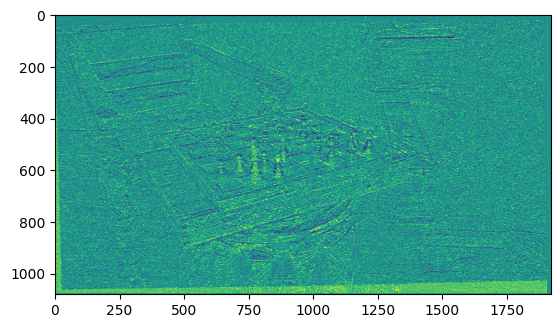

[-8589934593 -4294967297 -4294967295 ...  4278190073  4278190075
  4278190077]
1715866


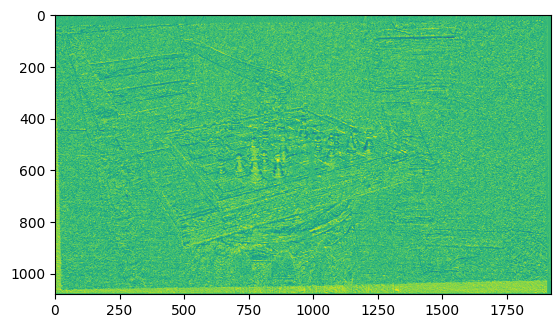

[-17179869185  -8589934593  -4294967297 ...   4278190067   4278190071
   4278190075]
1610358


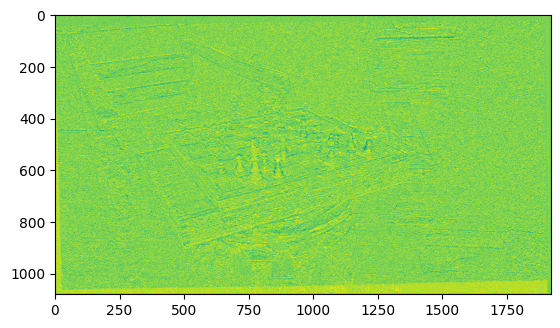

[-34359738369 -17179869185  -8589934593 ...   4278190055   4278190063
   4278190071]
1473025


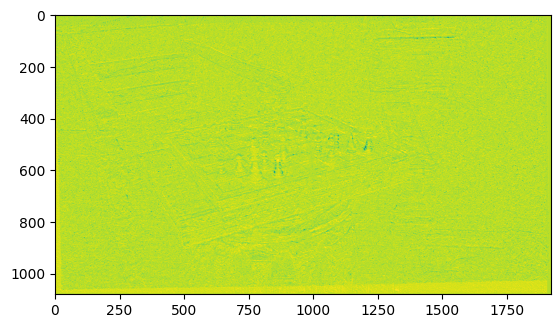

[-68719476737 -34359738369 -17179869185 ...   4278190031   4278190047
   4278190063]
1304774


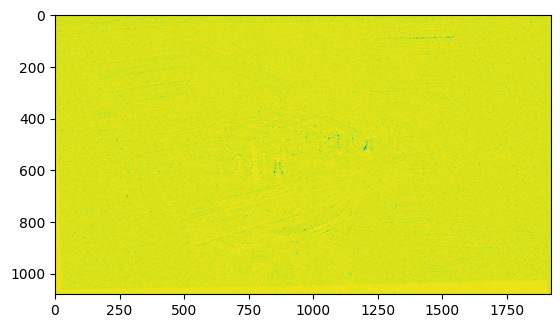

[-137438953473  -68719476737  -34359738369 ...    4278189983    4278190015
    4278190047]
1116130


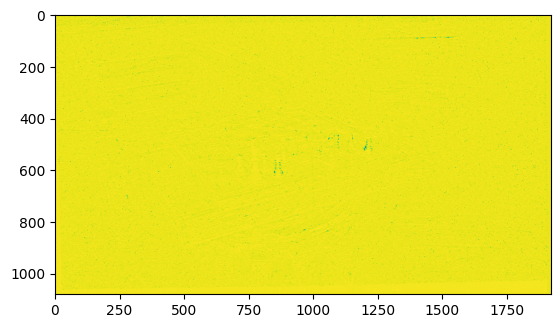

[-274877906945 -137438953473  -68719476737 ...    4278189887    4278189951
    4278190015]
920625


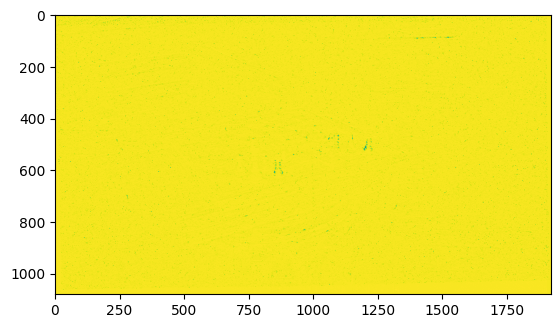

[-549755813889 -274877906945 -137438953473 ...    4278189695    4278189823
    4278189951]
735198


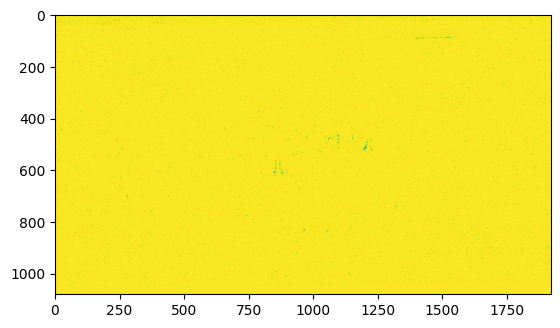

[-1099511627777  -549755813889  -274877906945 ...     4278189311
     4278189567     4278189823]
569545


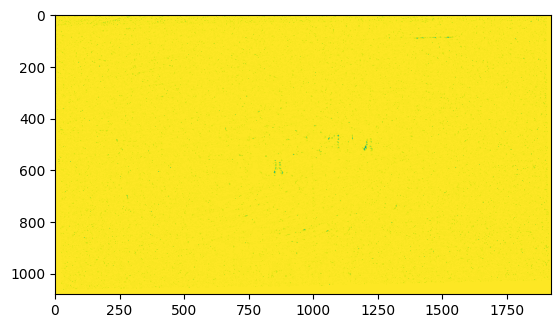

[-2199023255553 -1099511627777  -549755813889 ...     4278188543
     4278189055     4278189567]
428956


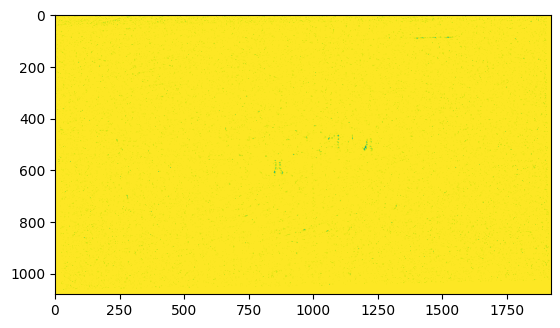

[-4398046511105 -2199023255553 -1099511627777 ...     4278187007
     4278188031     4278189055]
314935


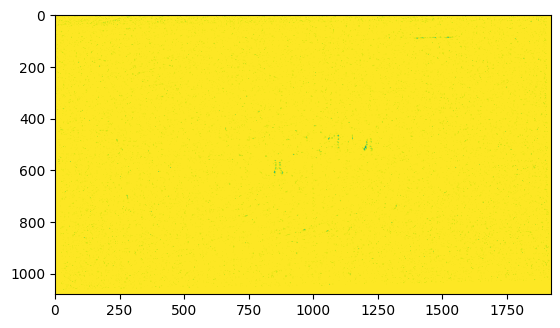

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=uint32)

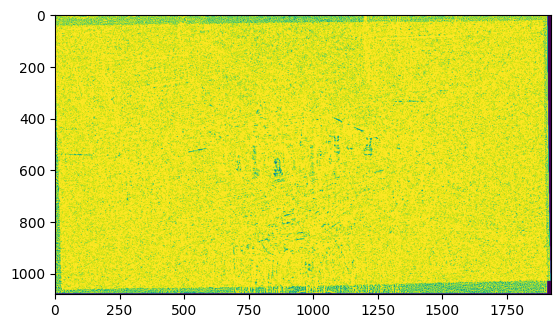

In [68]:
x_offset = int(csize[1] / 2)
d = 16

left_cost_volume = np.zeros(shape = (height, width, max_disparity), dtype = np.uint32)
lcensus = np.zeros(shape = (height, width), dtype = np.uint32)

lcensus[:, x_offset:(width - d - x_offset)] = left_census[:, (x_offset + d) : (width - x_offset)] 
print(x_offset, (width - d - x_offset))

right_xor = np.bitwise_xor(np.int32(right_census), lcensus)
right_distance = np.zeros(shape = (height, width), dtype = np.uint32)
i = 0
while not np.all(right_xor == 0) :

    
    tmp = right_xor - 1
    print(np.unique(tmp))
    print(len(np.unique(tmp)))
    plt.imshow(tmp)
    plt.show()

    mask = right_xor != 0
    right_xor[mask] = np.bitwise_and(right_xor[mask], tmp[mask])
    right_distance[mask] = right_distance[mask] + 1

    i += 1
    if i> 10 :
        break

plt.imshow(right_distance)
np.unique(right_distance)

In [99]:
a = [0b1111] # 15
b = [0b1011] # 11

xor = np.bitwise_xor(a,b)

print(xor)


for _ in range(12) :    
    tmp = xor - 1
    mask = xor != 0
    xor[mask] = np.bitwise_and(xor[mask], tmp[mask])
    print(np.bitwise_and(xor, tmp))
    

[4]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]


8

In [83]:

xor = np.bitwise_xor([8,7,6,5,4,3,2,1], [1,2,3,4,5,6,7,8])
distance = np.zeros(8, np.uint8)
while not np.all(xor == 0) :
    
    tmp = xor - 1
    mask = xor != 0
    xor[mask] = np.bitwise_and(xor[mask], tmp[mask])
    distance[mask] = distance[mask] + 1


    print(xor)
    print(distance)
    print('')


[8 4 4 0 0 4 4 8]
[1 1 1 1 1 1 1 1]

[0 0 0 0 0 0 0 0]
[2 2 2 1 1 2 2 2]



In [75]:
print(xor)

[9 5 5 1 1 5 5 9]


In [79]:
print(xor)

[8 4 4 0 0 4 4 8]


In [25]:
left_cost_volume, right_cost_volume = compute_costs(left_census, right_census, max_disparity, csize, height, width)

	Computing cost volumes...	(done in 99.00s)


In [26]:
def normalize(disp, max_disparity):
    """
    Normalizes the disparity map, then
    quantizes it so that it can be displayed. 
    Arguments:
        - disp: disparity map with dimensions H x W.
        - max_disparity: maximum disparity of the array.
    
    Return: normalized then quantized array, ready for visualization.
    """
    return 255.0 * disp / max_disparity

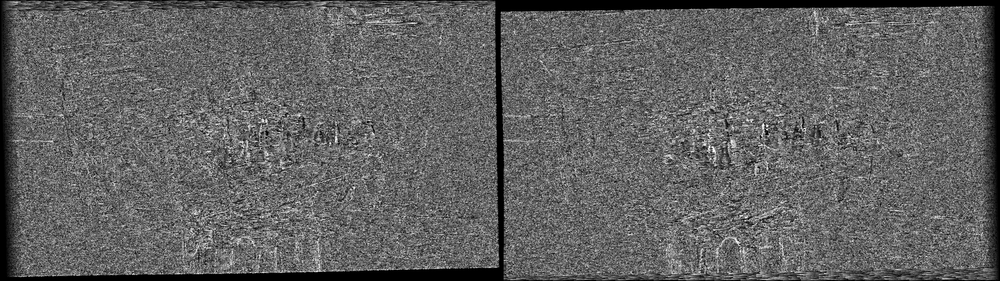

In [27]:
left_costs = np.uint8(normalize(np.argmin(left_cost_volume, axis=2), max_disparity))
right_costs = np.uint8(normalize(np.argmin(right_cost_volume, axis=2), max_disparity))

joined_costs = np.concatenate([left_costs, right_costs], axis=1)
display(Image.fromarray(joined_costs))

In [28]:
def get_penalties(max_disparity, P2, P1):
    """
    Creates a matrix of all the potential penalties for matching
    a current disparity (represented by the column index), with 
    a previous disparity (represented by the row index).
    Arguments:
        - max_disparity: Maximum disparity of the array.
        - P2: Penalty for disparity difference > 1
        - P1: Penalty for disparity difference = 1
    
    Return: Matrix containing all the penalties when disparity d1 from a column
            is matched with a previous disparity d2 from the row.
    """
    p2 = np.full(shape=(max_disparity, max_disparity), fill_value=P2, dtype=np.uint32)
    p1 = np.full(shape=(max_disparity, max_disparity), fill_value=P1 - P2, dtype=np.uint32)
    p1 = np.tril(p1, k=1) # keep values lower than k'th diagonal
    p1 = np.triu(p1, k=-1) # keep values higher than k'th diagonal
    no_penalty = np.identity(max_disparity, dtype=np.uint32) * -P1 # create diagonal matrix with values -p1
    penalties = p1 + p2 + no_penalty
    return penalties


def get_path_cost(slice, offset, penalties, other_dim, disparity_dim):
    """
    Calculates the minimum costs for all potential disparities of 
    the pixels along a single path direction.
    Arguments:
        - slice: Array containing costs for all disparities, D, 
            along a direction, M, with dimension M x D
        - offset: Number of pixels on the border to ignore.
        - penalties: Matrix containing the penalties to assign to the 
            previous disparities costs. For previous disparities that differ 
            from current disparities. 
        - other_dim: Number of pixels in the current paths direction.
        - disparity_dim: Number of disparities to calculate minimum costs.

    Returns: The pixels minimum costs for all disparities, D, 
        along path direction, M, with shape M x D.
    """
    minimum_cost_path = np.zeros(shape=(other_dim, disparity_dim), dtype=np.uint32)
    minimum_cost_path[offset - 1, :] = slice[offset - 1, :]

    for pixel_index in range(offset, other_dim):
        # Get all the minimum disparities costs from the previous pixel in the path
        previous_cost = minimum_cost_path[pixel_index - 1, :]
        # Get all the disparities costs (from the cost volume) for the current pixel
        current_cost = slice[pixel_index, :]
        costs = np.repeat(previous_cost, repeats=disparity_dim, axis=0).reshape(disparity_dim, disparity_dim)
        # Add penalties to the previous pixels disparities that differ from current pixels disparities
        costs = costs + penalties
        # Find minimum costs for the current pixels disparities using the previous disparities costs + penalties 
        costs = np.amin(costs, axis=0)  
        # Current pixels disparities costs + minimum previous pixel disparities costs (with penalty) - 
        # (constant term) minimum previous cost from all disparities 
        pixel_direction_costs = current_cost + costs - np.amin(previous_cost)
        minimum_cost_path[pixel_index, :] = pixel_direction_costs

    return minimum_cost_path    


def aggregate_costs(cost_volume, P2, P1, height, width, disparities):
    """
    Calculates the pixels costs for all disparities along all paths (4 in this case).

    Arguments: 
        - cost_volume: Array containing the matching cost for each pixel at each disparity.
        - P2: Penalty for disparity difference > 1
        - P1: Penalty for disparity difference = 1
        - height: Number of rows of the image.
        - width: Number of columns of the image.
        - disparities: Number of disparities to calculate minimum matching costs.

    Returns: Array containing the pixels matching costs for all disparities along 
        all directions, with dimension H x W x D X 4.
    """
    sys.stdout.flush()
    dawn = t.time()

    penalties = get_penalties(disparities, P2, P1)

    print("\tProcessing North and South aggregation...")
    south_aggregation = np.zeros(shape=(height, width, disparities), dtype=np.uint32)
    north_aggregation = np.copy(south_aggregation)

    for x in range(0, width):
        # Takes all the rows and disparities for a single column
        south = cost_volume[:, x, :]
        # Invert the rows to get the opposite direction
        north = np.flip(south, axis=0)
        south_aggregation[:, x, :] = get_path_cost(south, 1, penalties, height, disparities)
        north_aggregation[:, x, :] = np.flip(get_path_cost(north, 1, penalties, height, disparities), axis=0)


    print("\tProcessing East and West aggregation...", end='')
    east_aggregation = np.copy(south_aggregation)
    west_aggregation = np.copy(south_aggregation)
    for y in range(0, height):
        # Takes all the column and disparities for a single row
        east = cost_volume[y, :, :]
        # Invert the columns to get the opposite direction
        west = np.flip(east, axis=0)
        east_aggregation[y, :, :] = get_path_cost(east, 1, penalties, width, disparities)
        west_aggregation[y, :, :] = np.flip(get_path_cost(west, 1, penalties, width, disparities), axis=0)

    # Combine the costs from all paths into a single aggregation volume
    aggregation_volume = np.concatenate((south_aggregation[..., None], north_aggregation[..., None], east_aggregation[..., None], west_aggregation[..., None]), axis=3)

    dusk = t.time()
    print('\t(done in {:.2f}s)'.format(dusk - dawn))

    return aggregation_volume

In [29]:
print('\nStarting left aggregation computation...')
left_aggregation_volume = aggregate_costs(left_cost_volume, P2, P1, height, width, max_disparity)


Starting left aggregation computation...
	Processing North and South aggregation...
	Processing East and West aggregation...	(done in 134.99s)


In [30]:
print('\nStarting right aggregation computation...')
right_aggregation_volume = aggregate_costs(right_cost_volume, P2, P1, height, width, max_disparity)


Starting right aggregation computation...
	Processing North and South aggregation...
	Processing East and West aggregation...	(done in 139.53s)


In [31]:
def select_disparity(aggregation_volume):
    """
    Converts the aggregation volume into a disparity map using 
    the winner takes all strategy. 
    Cost volume is first calculated by taking the sum of the costs over all paths.
    Then the disparities are determined by finding the 
    disparity index with the lowest cost for the pixel.

    Arguments:
        - aggregation_volume: Array containing the matching costs for 
            all pixels at all disparities and paths, with dimension H x W x D x N

    Returns: Disparity map with dimensions H x W.
    """
    # sum up costs for all directions
    volume = np.sum(aggregation_volume, axis=3) 
    # returns the disparity index with the minimum cost associated with each h x w pixel
    disparity_map = np.argmin(volume, axis=2) 
    return disparity_map

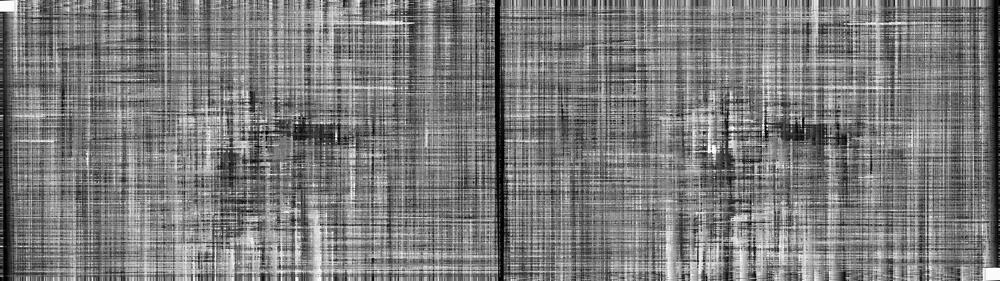

In [32]:
left_disparity_map = np.uint8(normalize(select_disparity(left_aggregation_volume), max_disparity))
right_disparity_map = np.uint8(normalize(select_disparity(right_aggregation_volume), max_disparity))

joined_disparity_map = np.concatenate([left_disparity_map, right_disparity_map], axis=1)
display(Image.fromarray(joined_disparity_map))